# Exploratory data analysis for MVTEC-AD

In [1]:
import os

import imagehash
from PIL import Image

import seaborn as sns
import matplotlib.pyplot as plt

from cv_anomaly_detection.utils import MVTEC_AD
from cv_anomaly_detection.img_dataframe import ImageDataFrameMVTEC
from cv_anomaly_detection.metrics.img_metrics import measure_brightness
from cv_anomaly_detection.utils.plots import show, show_list_of_images

%load_ext autoreload
%autoreload 2

# Overview

Listing all classes for later visualization

In [2]:
datasets = [dir_ds for dir_ds in os.listdir(MVTEC_AD) if os.path.isdir(os.path.join(MVTEC_AD, dir_ds)) ]

datasets

['hazelnut',
 'tile',
 'screw',
 'zipper',
 'leather',
 'toothbrush',
 'transistor',
 'carpet',
 'wood',
 'bottle',
 'pill',
 'capsule',
 'metal_nut',
 'cable',
 'grid']

In [3]:
# chosen class is cable
img_df = ImageDataFrameMVTEC(category="cable")

In [4]:
img_df.init_default()

['cut_outer_insulation', 'cut_inner_insulation', 'combined', 'poke_insulation', 'good', 'missing_wire', 'missing_cable', 'cable_swap', 'bent_wire']


In [5]:
img_df.df

,image_path,width,height,dataset_type,class
0,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,train,good
1,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,train,good
2,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,train,good
3,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,train,good
4,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,train,good
...,...,...,...,...,...
369,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,bent_wire
370,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,bent_wire
371,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,bent_wire
372,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,bent_wire


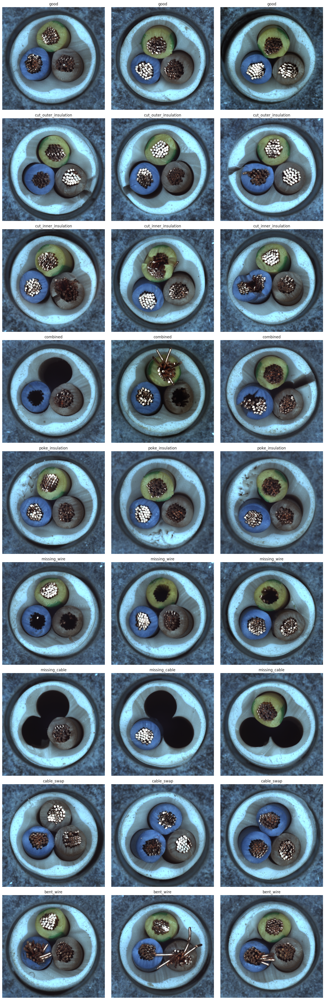

In [6]:
# sample for all classes of the cable dataset
img_df.sample_images_plot()

# Metrics

the metrics chosen are perceptual hash and image brightness to observe if there are some patterns comparing "good" from defective classes

In [7]:
metrics = (
    ("dhash", lambda path: imagehash.dhash(Image.open(path))),
    ("brightness", lambda path: measure_brightness(Image.open(path))),
    ("phash", lambda path: imagehash.phash(Image.open(path))),
    ("whash", lambda path: imagehash.whash(Image.open(path))),
)

img_df.apply_metrics(metrics)

# Checking for duplicates with DifferenceHash

In [8]:
img_df.find_duplicates("dhash")

,image_path,width,height,dataset_type,class,dhash,brightness,phash,whash


# Chosen features visualization

first we will begin with brightness to see if we can find some pattern

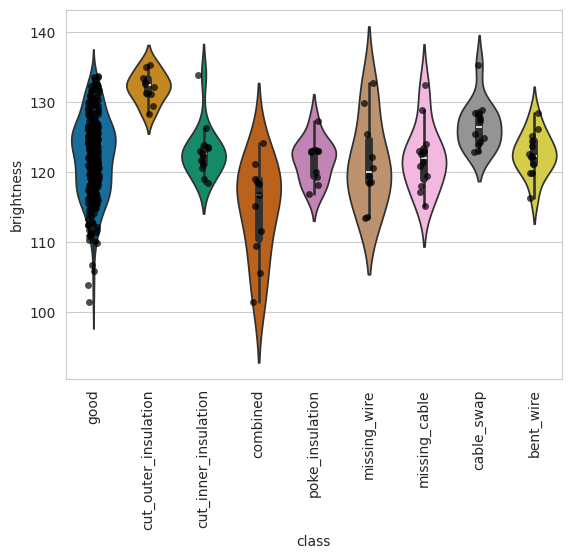

In [9]:
sns.violinplot(x='class', y='brightness', data=img_df.df, hue='class', palette='colorblind')
sns.stripplot(x='class', y='brightness', data=img_df.df, color='k', alpha=0.7)

plt.xticks(rotation=90)
plt.show()

## Brightness

the "good" class has a lot of overlap between the defective classes which is not sufficient to differ the good from the other defective classes. Interestingly the cut outer insulation seems to have a higher brightness pattern compared to the other defective classes

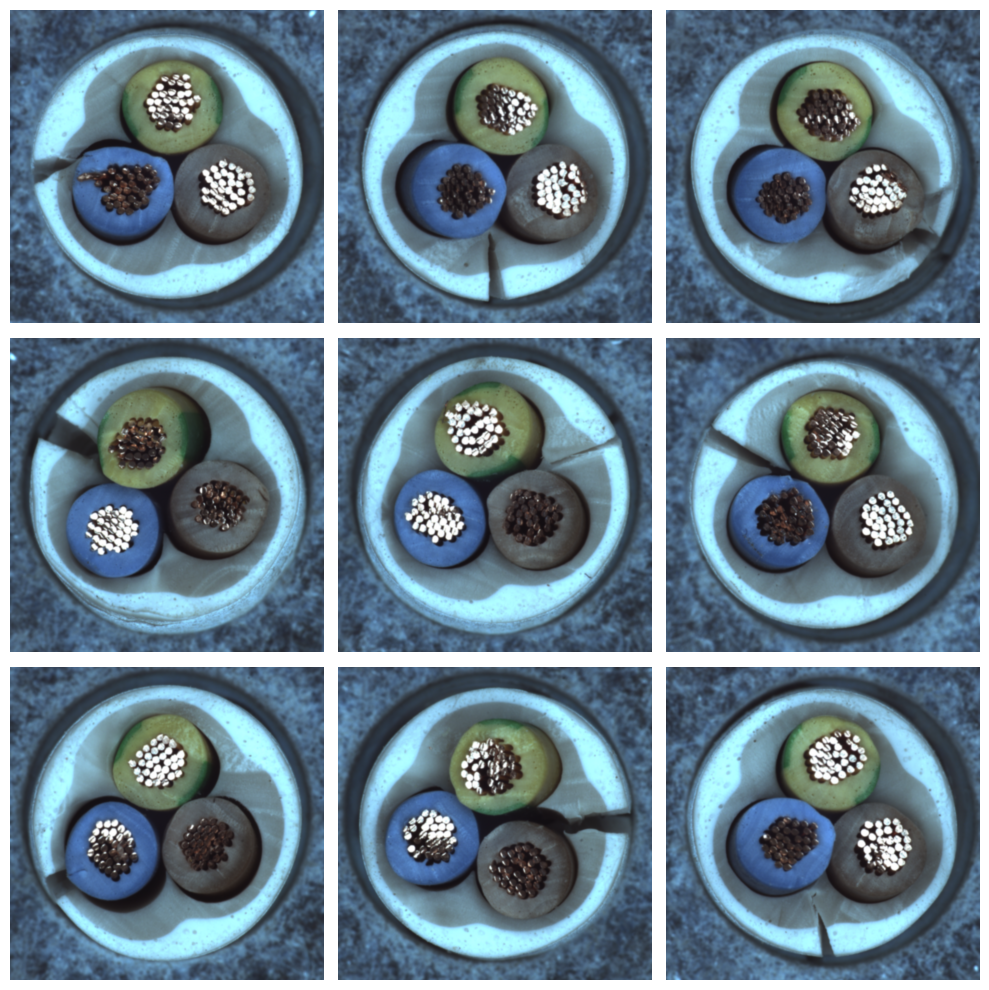

In [10]:
# filter the test dataset
test_df = img_df.df[img_df.df["dataset_type"] == "test"]

test_sample = test_df[test_df["class"] == "cut_outer_insulation"].sample(n=9, replace=False)

img_arr = [Image.open(path) for path in test_sample["image_path"]]

show_list_of_images(img_arr)


### Comparing with the "good" class

it seems that due to its cut, the white insulation shifts the mean of the brightness to a higher value, but not seemingly relevant enough to clearly separate from the 'good' class when visualizing the violin plot. 

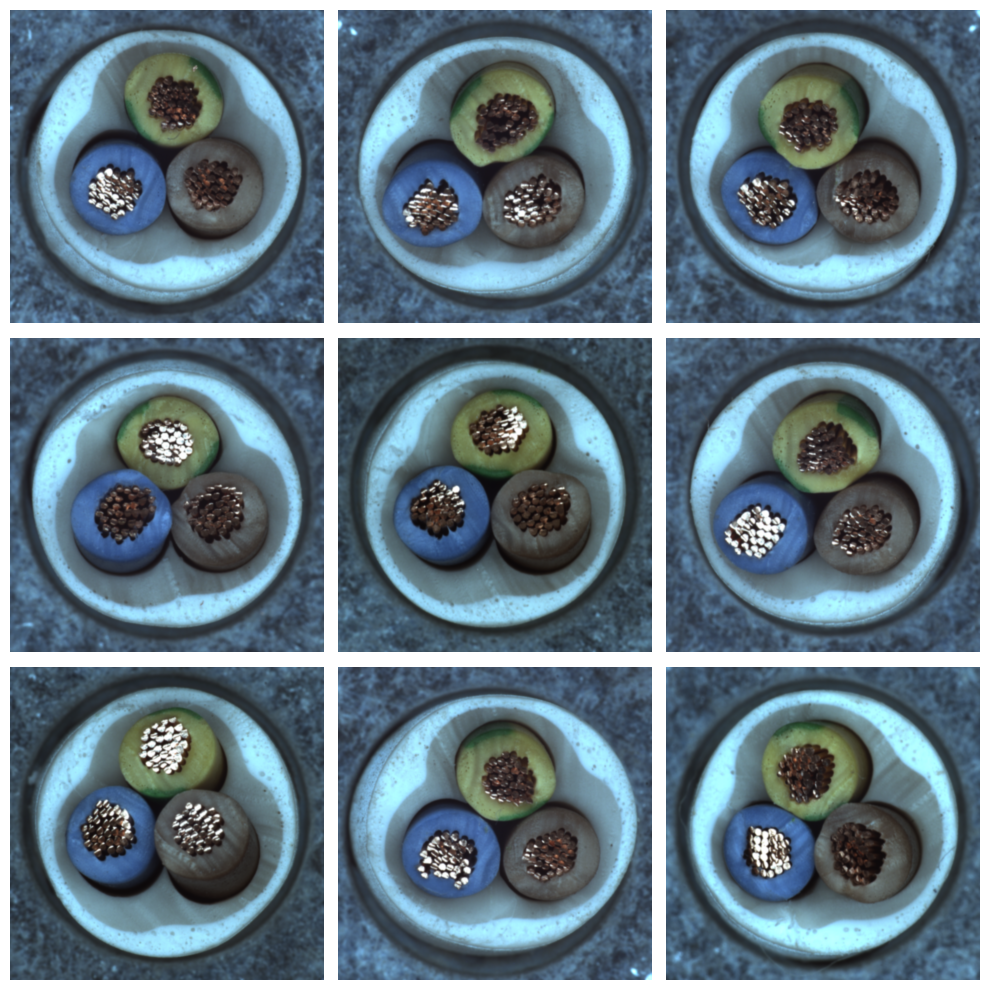

In [11]:
test_sample = test_df[test_df["class"] == "good"].sample(n=9, replace=False)
img_arr = [Image.open(path) for path in test_sample["image_path"]]

show_list_of_images(img_arr)


test_sample = test_df[test_df["class"] == "good"].sample(n=9, replace=False)

## Percetual Hash

First we will use an image of the 'good' class from the training sample, calculate its perceptual, difference and wavelet hash, and then subtract it from the test images.

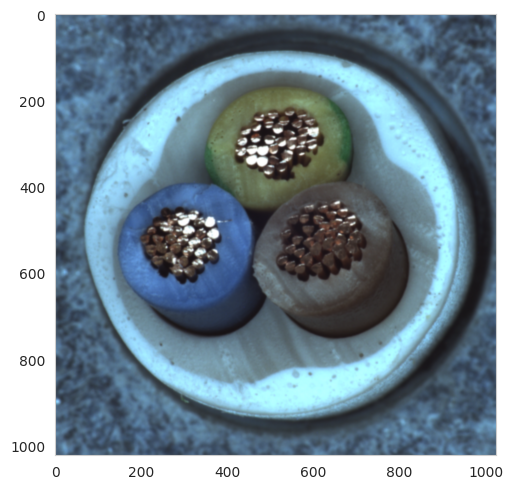

,image_path,width,height,dataset_type,class,dhash,brightness,phash,whash,dhash-diff,phash-diff,whash-diff
224,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,cut_outer_insulation,69d496929d96f871,133.447323,d0b40f2a6bc93d9a,187ecec3c5c27e18,20,22,10
225,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,cut_outer_insulation,31cdde929c86d173,131.164078,d0c70f7a38c93593,187e6ec2c7c07c1b,18,22,14
226,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,cut_outer_insulation,71dc8ca6b88cd1b2,131.346087,d0914f5a3ded3492,1c7e66d3c7c07c18,20,28,12
227,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,cut_outer_insulation,6bcc969a1d96d9f3,135.066537,90d50b3e3fc97492,187cfec2c5427f18,17,24,10
228,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,cut_outer_insulation,7adc96a60396d8f1,132.689311,85a49b3b6fd06cc1,187e7ec3a1027e3c,8,14,12
...,...,...,...,...,...,...,...,...,...,...,...,...
369,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,bent_wire,69d496aea296f031,122.281834,94b49b6b7ac1658c,987e7ec7c3427e00,14,20,10
370,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,bent_wire,394c8caecac6f439,128.522605,85b25a6f79986187,083e76d363627e98,19,22,12
371,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,bent_wire,334cce96a696d879,122.194251,d5a61b2c78b16197,193e76c3c3427e98,10,20,10
372,/home/marcelo/github.com/cv-anomaly-detection/...,1024,1024,test,bent_wire,39cc8ea6ab8ad879,119.878187,e0b61b5b68e56193,987e66d3c3427e18,14,24,8


In [12]:
train_df = img_df.df[(img_df.df["dataset_type"] == "train") & (img_df.df["class"] == "good")]
with Image.open(train_df.iloc[0]["image_path"]) as img:
    show(img)

hash_first = imagehash.dhash( Image.open(train_df.iloc[0]["image_path"]))
hash_p = imagehash.phash( Image.open(train_df.iloc[0]["image_path"]))
hash_w = imagehash.whash( Image.open(train_df.iloc[0]["image_path"]))

img_df.df["dhash-diff"] = img_df.df["dhash"].apply(lambda dhash: hash_first - dhash)
img_df.df["phash-diff"] = img_df.df["phash"].apply(lambda phash: hash_p - phash)
img_df.df["whash-diff"] = img_df.df["whash"].apply(lambda whash: hash_w - whash)

# filter the test dataset
test_df = img_df.df[img_df.df["dataset_type"] == "test"]
test_df

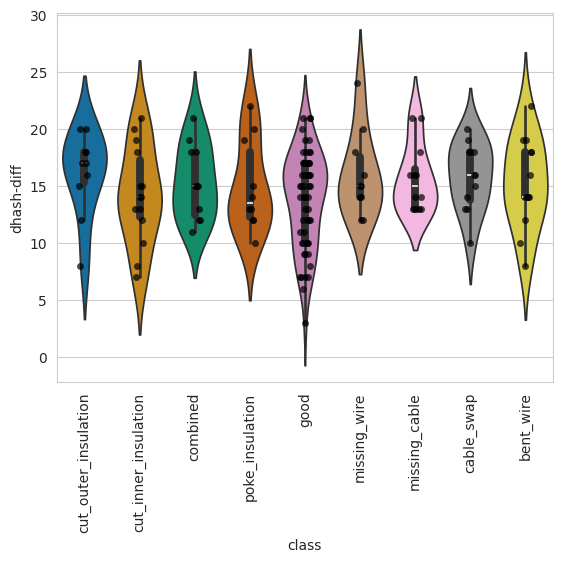

In [13]:
sns.violinplot(x='class', y='dhash-diff', data=test_df, hue='class', palette='colorblind')
sns.stripplot(x='class', y='dhash-diff', data=test_df, color='k', alpha=0.7)
plt.xticks(rotation=90)
plt.show()

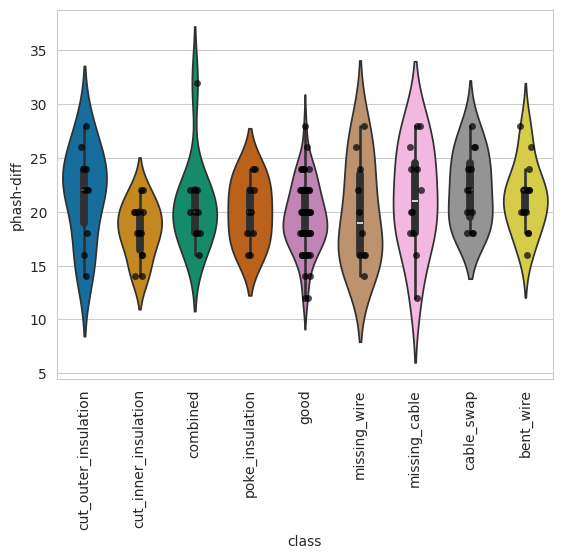

In [14]:
sns.violinplot(x='class', y='phash-diff', data=test_df, hue='class', palette='colorblind')
sns.stripplot(x='class', y='phash-diff', data=test_df, color='k', alpha=0.7)
plt.xticks(rotation=90)
plt.show()

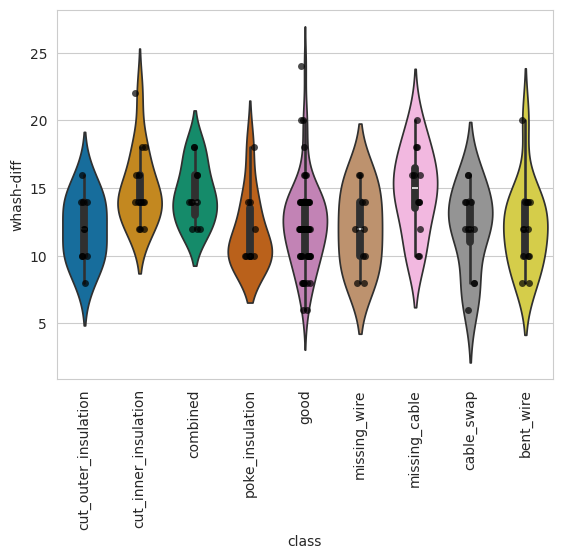

In [15]:
sns.violinplot(x='class', y='whash-diff', data=test_df, hue='class', palette='colorblind')
sns.stripplot(x='class', y='whash-diff', data=test_df, color='k', alpha=0.7)
plt.xticks(rotation=90)
plt.show()

# Conclusion

In spite of the characteristic distribution observed in brightness comparison, the violin plot indicates that this metric is insufficient for distinguishing samples belonging to the 'good' class. Additionally, the disparity in perceptual hashes, including difference-based, perceptual, and wavelet hashes, proved inadequate for segregating 'good' samples from defective ones. 

For subsequent steps, deep neural networks will be employed as feature extractors for further testing.